In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
import seaborn as sns
from scipy.ndimage import center_of_mass
import pandas as pd

from pathlib import Path
import random
import math
from copy import deepcopy
import shutil
from collections import defaultdict
from tqdm.notebook import tqdm

from src.visualise.plot import plot_data, plot_data_simple
from src.data.paths import project_dir
from src.data.analysis import Circle, create_circular_mask, read_tiff_img
from src.data.detector import find_circle_hough_method, img_for_circle_detection, DetectorDataCollection, DetectorData, DetectorImage

In [3]:
def center_of_mass_det(data: DetectorData) -> tuple[float, float]:
    detector_region = deepcopy(data.raw.image)
    circle_smaller_than_det = Circle(x=data.circle.x, y=data.circle.y, r=data.circle.r * 0.95)
    mask_circle = create_circular_mask(img=detector_region, circle_px=circle_smaller_than_det)
    detector_region[~mask_circle] = 0
    cm = center_of_mass(detector_region)
    return cm

# Data structures

In [4]:
# local paths
base_path = project_dir / 'data' / 'raw'
# raw_path = base_path / '2024-09-18'
# bg_path = base_path / '2024-09-16'

# # onedrive paths
# base_path = Path.home() / 'OneDrive - ifj.edu.pl' / 'Projects' / 'MB_foils'
# raw_path = base_path / '2024-09-18'
# bg_path = base_path / '2024-09-16'
base_path.exists()

True

In [6]:
#proton_path = base_path / '2024-11-21'
proton_path = base_path / '2024-12-12'
proton_raw_data = DetectorDataCollection(path=proton_path)

10 11 12 13 14 15 16 17 18 1 2 3 4 5 6 7 8 9 

In [7]:
co60_path = base_path / '2024-12-03'
co60_raw_data = DetectorDataCollection(path=co60_path)

16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 

In [8]:
bg_path = base_path / '2024-10-29' / 'tlo_pusty_det'
bg_path.exists()

True

In [9]:
bg_raw_det_path = next(bg_path.glob('**/*tif'))
bg_raw_det_image = DetectorImage(path=bg_raw_det_path, image=read_tiff_img(bg_raw_det_path, border_px=0))
bg_lv_det_path = next(bg_path.with_name(bg_path.name + '_lv').glob('**/*tif'))
bg_lv_det_image = DetectorImage(path=bg_lv_det_path, image=read_tiff_img(bg_lv_det_path, border_px=0))
bg_det_data = DetectorData(raw=bg_raw_det_image, lv=bg_lv_det_image, det_no=-1)

bg_raw_data = DetectorDataCollection(path=bg_path, data={-1: bg_det_data})

## Output paths

In [10]:
base_output_path = project_dir / 'data' / 'interim' / '2024-12-12'  # local 
#base_output_path =  Path.home() / 'OneDrive - ifj.edu.pl' / 'Projects' / 'MB_foils' / 'publication_Measurement_2024' / 'analysis' / 'interim' / '2024-11-21'  # OneDrive

proton_output_path = base_output_path / 'protons'
co60_output_path = base_output_path / 'Co60'
bg_output_path = base_output_path / 'background'

# remove base output path
shutil.rmtree(base_output_path, ignore_errors=True)

# create output paths
proton_output_path.mkdir(parents=True, exist_ok=True)
co60_output_path.mkdir(parents=True, exist_ok=True)
bg_output_path.mkdir(parents=True, exist_ok=True)

print(f"created {proton_output_path}")

created /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons


# Proton raw data

In [11]:
proton_det_id = list(proton_raw_data.data.keys())[0]
proton_det_id

10

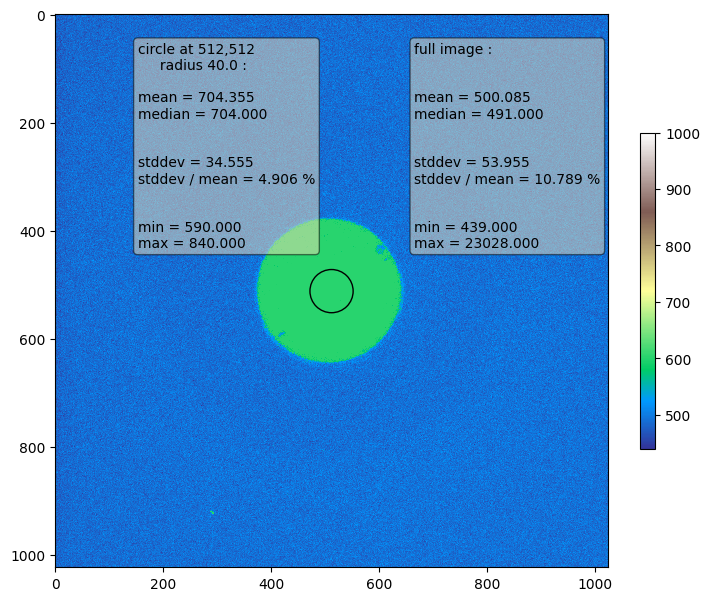

In [12]:
fig, ax = plot_data_simple(proton_raw_data.data[proton_det_id].raw.image, circle_px=proton_raw_data.data[proton_det_id].lv.init_circle, vmax=1000, figsize=(7, 8))

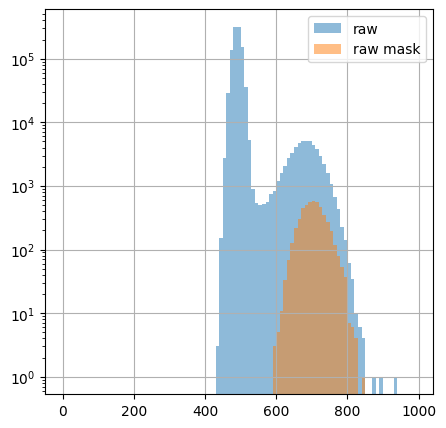

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
bins = np.arange(0, 1000, 10)
mask = create_circular_mask(proton_raw_data.data[proton_det_id].raw.image, proton_raw_data.data[proton_det_id].raw.init_circle)
ax.hist(proton_raw_data.data[proton_det_id].raw.image.flatten(), bins=bins, alpha=0.5, label='raw');
ax.hist(proton_raw_data.data[proton_det_id].raw.image[mask].flatten(), bins=bins, alpha=0.5, label='raw mask');
ax.set_yscale('log')
ax.grid()
ax.legend();

# Co60 raw data

In [15]:
co60_det_id = list(co60_raw_data.data.keys())[0]
co60_det_id

16

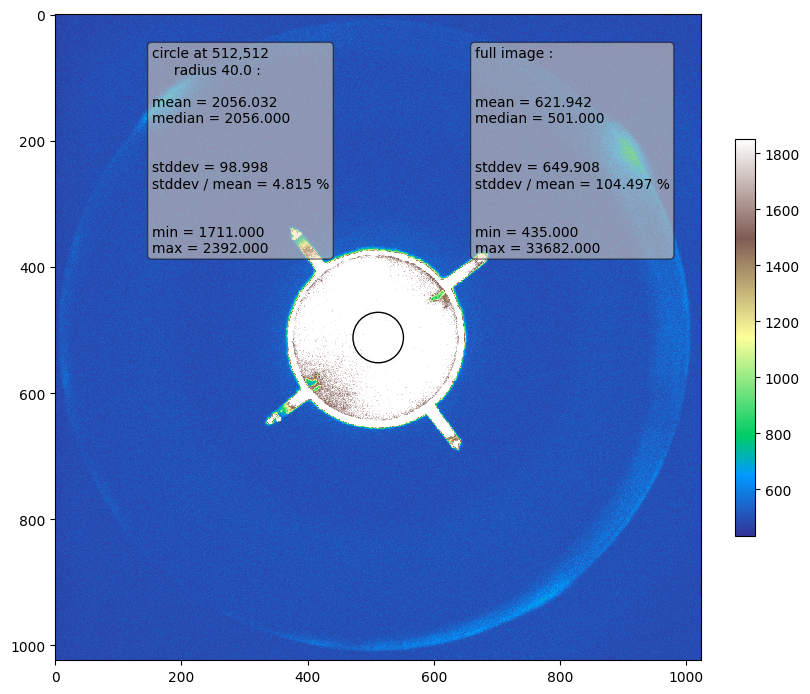

In [16]:
fig, ax = plot_data(co60_raw_data.data[co60_det_id].lv.image, circle_px=co60_raw_data.data[co60_det_id].lv.init_circle)

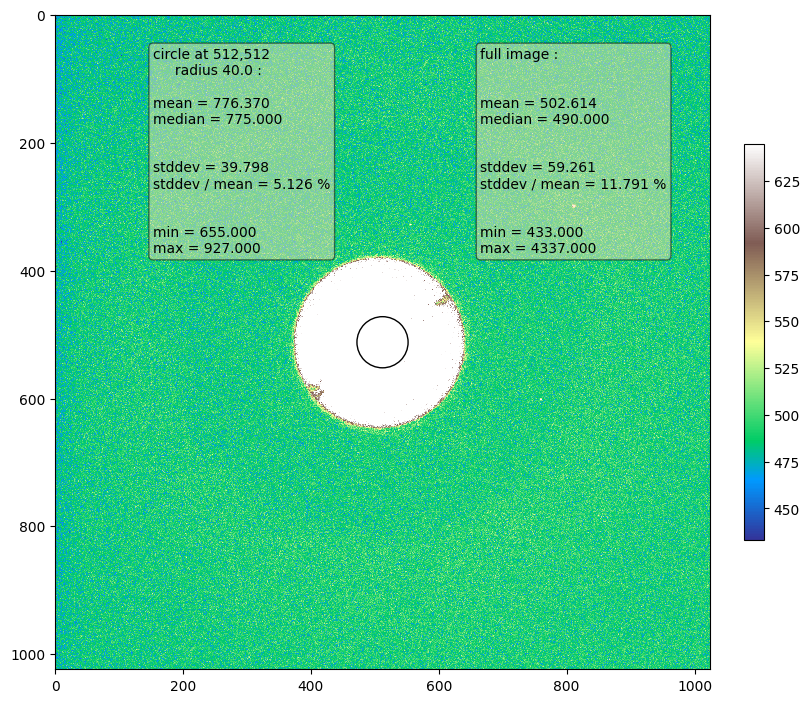

In [17]:
fig, ax = plot_data_simple(co60_raw_data.data[co60_det_id].raw.image, circle_px=co60_raw_data.data[co60_det_id].raw.init_circle)

## Background

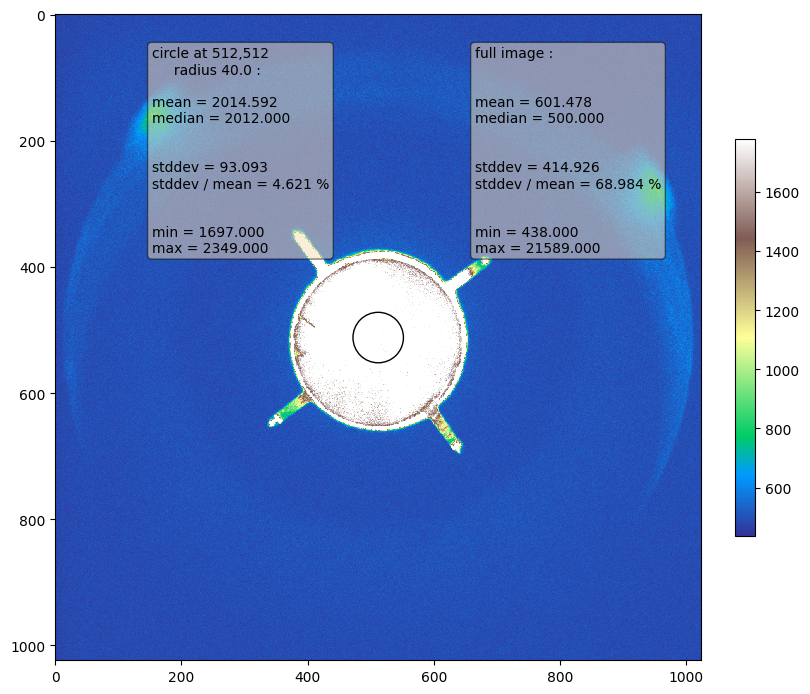

In [18]:
fig, ax = plot_data(bg_det_data.lv.image, circle_px=bg_det_data.lv.init_circle)

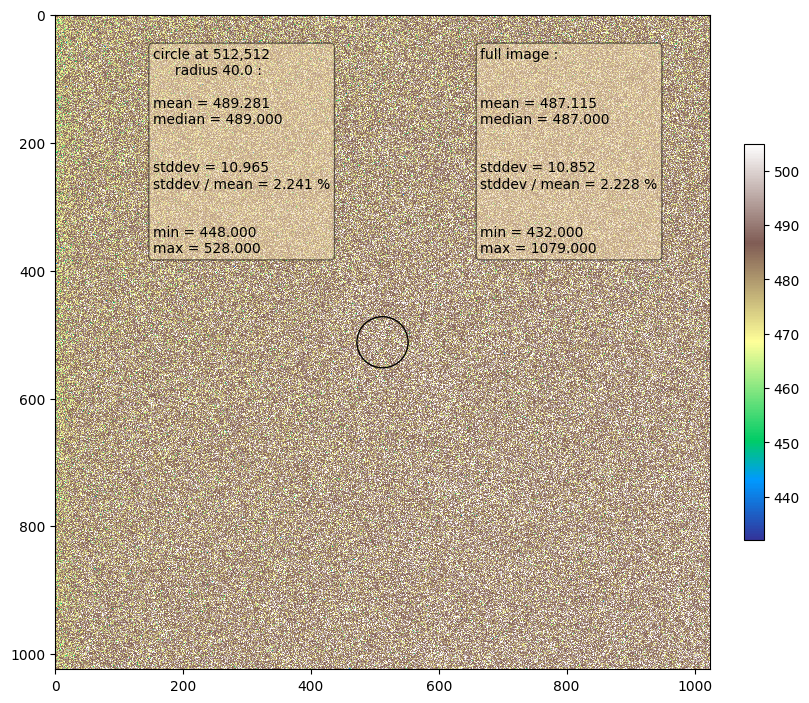

In [19]:
fig, ax = plot_data(bg_det_data.raw.image, circle_px=bg_det_data.raw.init_circle)

# Save plots

## Save LV without detector

In [20]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path, bg_output_path],
    [proton_raw_data, co60_raw_data, bg_raw_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'live_view'
    plot_path.mkdir(parents=True, exist_ok=True)

    # set vmin to the 5% centile of all images and vmax to 95% centile
    concatenated_flattened_lv_data = np.concatenate([data.lv.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_lv_data, q=5)
    vmax = np.nanpercentile(a=concatenated_flattened_lv_data, q=95)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'lv_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        #print(f"Saving detector {det_no} / {len(dataset.data)} into {output_path}")
        fig, ax = plot_data_simple(data.lv.image, circle_px=data.lv.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 480.0, vmax: 1904.0
vmin: 478.0, vmax: 1901.0
vmin: 477.0, vmax: 1779.0


## Save raw data without detector

In [21]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path, bg_output_path],
    [proton_raw_data, co60_raw_data, bg_raw_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'raw_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'raw_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.raw.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 468.0, vmax: 988.6000000000004
vmin: 469.0, vmax: 890.0
vmin: 467.0, vmax: 503.0


# Background subtraction

In [22]:
proton_bg_sub_data = DetectorDataCollection(path=proton_raw_data.path, data=deepcopy(proton_raw_data.data))
for data in proton_bg_sub_data.data.values():
    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, bg_det_data.raw.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=bg_det_data.raw.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)


In [23]:
co60_bg_sub_data = DetectorDataCollection(path=co60_raw_data.path, data=deepcopy(co60_raw_data.data))
for data in co60_bg_sub_data.data.values():

    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, bg_det_data.raw.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=bg_det_data.raw.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)

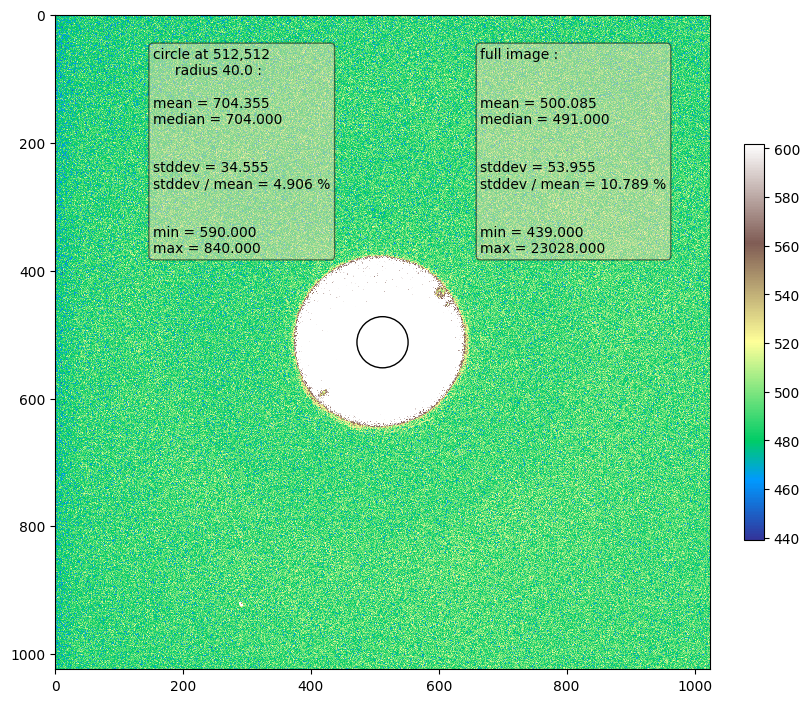

In [24]:
fig, ax = plot_data_simple(proton_raw_data.data[proton_det_id].raw.image, circle_px=proton_raw_data.data[proton_det_id].raw.init_circle)

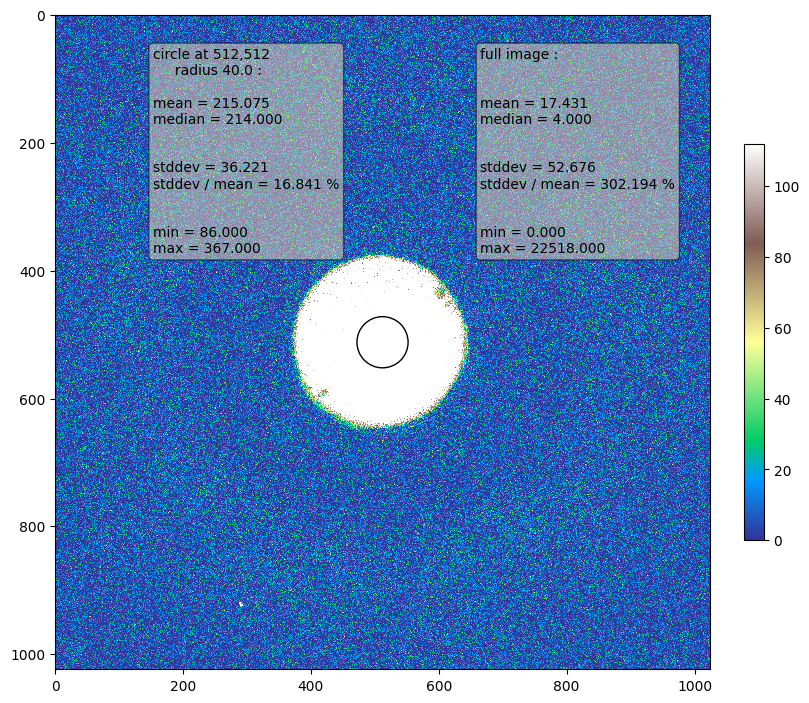

In [25]:
fig, ax = plot_data(proton_bg_sub_data.data[proton_det_id].raw.image, circle_px=proton_bg_sub_data.data[proton_det_id].raw.init_circle)

In [26]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_bg_sub_data, co60_bg_sub_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.raw.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 501.0
vmin: 0.0, vmax: 403.0


# Detector discovery

In [27]:
det_data_dict = {}
for data in proton_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
proton_det_data = DetectorDataCollection(path=proton_raw_data.path, data=det_data_dict)

10 11 12 13 14 15 16 17 18 1 2 3 4 5 6 7 8 9 

In [28]:
det_data_dict = {}
for data in co60_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
co60_det_data = DetectorDataCollection(path=co60_raw_data.path, data=det_data_dict)

16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 

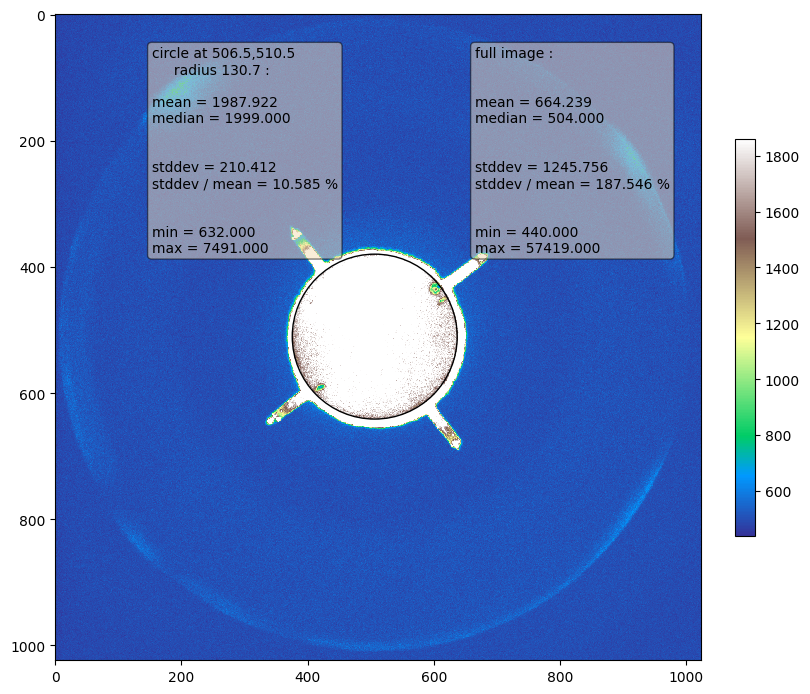

In [29]:
fig, ax = plot_data(proton_det_data.data[proton_det_id].lv.image, circle_px=proton_det_data.data[proton_det_id].circle)

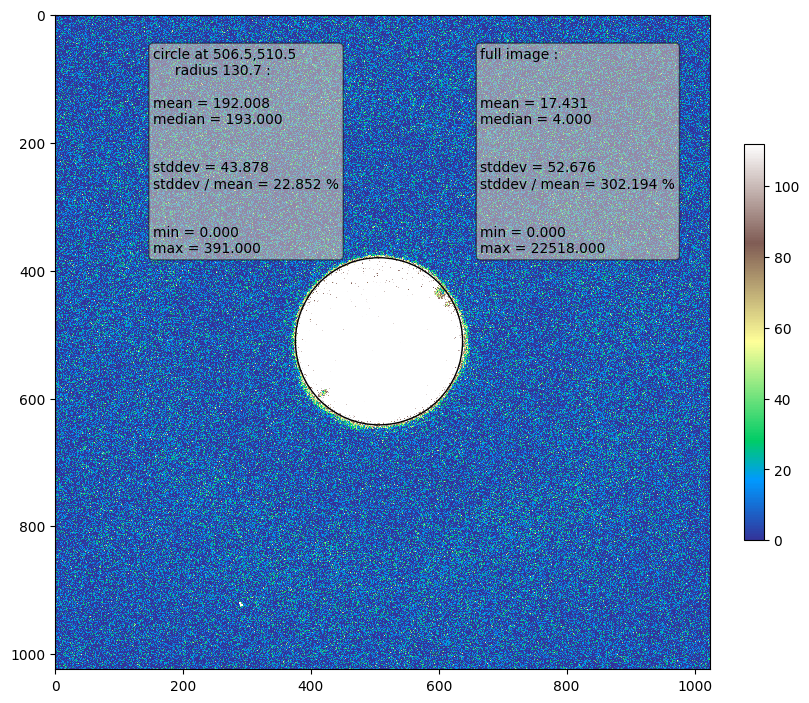

In [30]:
fig, ax = plot_data(proton_det_data.data[proton_det_id].raw.image, circle_px=proton_det_data.data[proton_det_id].circle)

In [31]:
mean_radius = np.mean([data.circle.r for data in proton_det_data.data.values()])
mean_radius_mm = 10.0
px_to_mm = mean_radius_mm / mean_radius
px_to_mm

0.07615501757284933

In [32]:
# fig, ax = plt.subplots(2, 3, figsize=(12, 8))
# for data in proton_det_data.data.values():
#     ax[0, 0].plot(data.det_no, data.circle.x, '.')
#     ax[0, 1].plot(data.det_no, data.circle.y, '.')
#     ax[0, 2].plot(data.det_no, data.circle.r, '.')
# for data in co60_det_data.data.values():
#     ax[1, 0].plot(data.det_no, data.circle.x, '.')
#     ax[1, 1].plot(data.det_no, data.circle.y, '.')
#     ax[1, 2].plot(data.det_no, data.circle.r, '.')
# for a in ax.flat:
#     a.grid()
# for a in ax[0]:
#     a.set_xlabel('Proton det no')
# for a in ax[1]:
#     a.set_xlabel('Co60 det no')
# for a in ax[:, 0]:
#     a.set_ylabel('Det center x [px]')
# for a in ax[:, 1]:
#     a.set_ylabel('Det center y [px]')
# for a in ax[:, 2]:
#     a.set_ylabel('Det radius [px]')
# fig.tight_layout()

In [33]:
# fig, ax = plt.subplots(2, 3, figsize=(12, 8))
# for data in proton_det_data.data.values():
#     ax[0, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
#     ax[0, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
#     ax[0, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
# for data in co60_det_data.data.values():
#     ax[1, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
#     ax[1, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
#     ax[1, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
# for a in ax.flat:
#     a.grid()
# for a in ax[0]:
#     a.set_xlabel('Proton det no')
# for a in ax[1]:
#     a.set_xlabel('Co60 det no')
# for a in ax[:, 0]:
#     a.set_ylabel('Det center x [mm]')
# for a in ax[:, 1]:
#     a.set_ylabel('Det center y [mm]')
# for a in ax[:, 2]:
#     a.set_ylabel('Det radius [mm]')
# fig.tight_layout()

## Save plots with detector

In [34]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'live_view'
    plot_path.mkdir(parents=True, exist_ok=True)

    # set vmin to the 5% centile of all images and vmax to 95% centile
    concatenated_flattened_lv_data = np.concatenate([data.lv.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_lv_data, q=5)
    vmax = np.nanpercentile(a=concatenated_flattened_lv_data, q=95)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_lv_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.lv.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        print(f"Saving {output_path}")
        plt.close(fig)

vmin: 480.0, vmax: 1904.0
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det10
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det11
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det12
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det13
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det14
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det15
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det16
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det17
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_view/det_lv_det18
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2024-12-12/protons/live_vi

In [35]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 501.0
vmin: 0.0, vmax: 403.0


## Detector cutting

In [36]:
min_radius_protons = min([data.circle.r for data in proton_det_data.data.values()])
min_radius_co60 = min([data.circle.r for data in co60_det_data.data.values()])
min_radius_all = np.floor(min(min_radius_protons, min_radius_co60)).astype(int)
min_radius_all
#min_radius_all = min_radius_protons

#print(f"min radius - protons: {min_radius_protons:.2f}, Co60: {min_radius_co60:.2f}, all: {min_radius_all}")
#print(f"min radius - protons: {min_radius_protons * px_to_mm:.2f} [mm], Co60: {min_radius_co60 * px_to_mm:.2f} [mm], all: {min_radius_all * px_to_mm:.2f} [mm]")

128

In [37]:
def cut_detector(det_data: DetectorData, min_radius: int, factor: float = 1.2) -> DetectorData:
    lower_x = np.ceil(det_data.circle.x - factor*min_radius).astype(int)
    upper_x = np.floor(det_data.circle.x + factor*min_radius).astype(int)
    lower_y = np.ceil(det_data.circle.y - factor*min_radius).astype(int)
    upper_y = np.floor(det_data.circle.y + factor*min_radius).astype(int)
    
    new_circle = Circle(x=det_data.circle.x - lower_x, y=det_data.circle.y - lower_y, r=det_data.circle.r)
    cut_raw_image = det_data.raw.image[lower_y:upper_y, lower_x:upper_x][:]
    cut_lv_image = det_data.lv.image[lower_y:upper_y, lower_x:upper_x][:]

    return DetectorData(raw=DetectorImage(image=cut_raw_image, path=det_data.raw.path), lv=DetectorImage(image=cut_lv_image, path=det_data.lv.path), det_no=det_data.det_no, circle=new_circle)

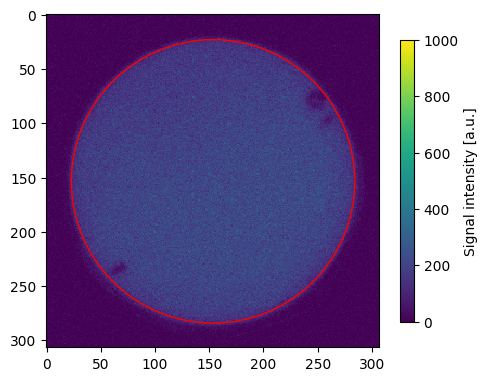

In [38]:
c1 = cut_detector(proton_det_data.data[proton_det_id], min_radius_all)

fig, ax = plt.subplots(figsize=(5, 5), facecolor='none')
im = ax.imshow(c1.raw.image, cmap='viridis', vmin=0, vmax=1000, interpolation='none')
ax.add_artist(plt.Circle((c1.circle.x, c1.circle.y), c1.circle.r, color='red', fill=False))
fig.colorbar(im, ax=ax, shrink=0.6, label='Signal intensity [a.u.]')
fig.tight_layout()

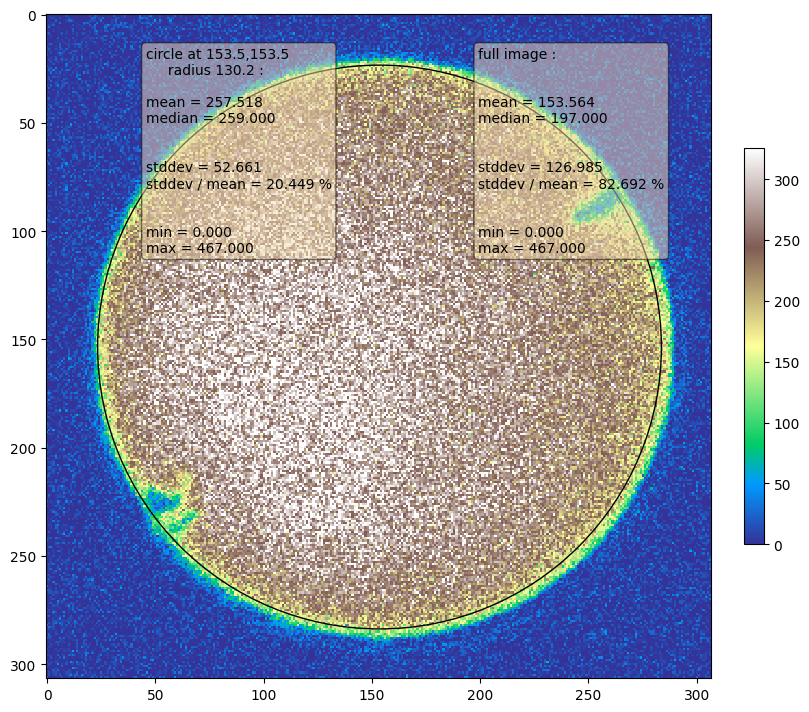

In [39]:
c1 = cut_detector(co60_det_data.data[co60_det_id], min_radius_all)
fig, ax = plot_data(c1.raw.image, circle_px=c1.circle)

In [40]:
det_data_dict = {}
for data in proton_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
proton_det_cut_data = DetectorDataCollection(path=proton_det_data.path, data=det_data_dict)

10 11 12 13 14 15 16 17 18 1 2 3 4 5 6 7 8 9 

In [41]:
det_data_dict = {}
for data in co60_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
co60_det_cut_data = DetectorDataCollection(path=co60_det_data.path, data=det_data_dict)

16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 

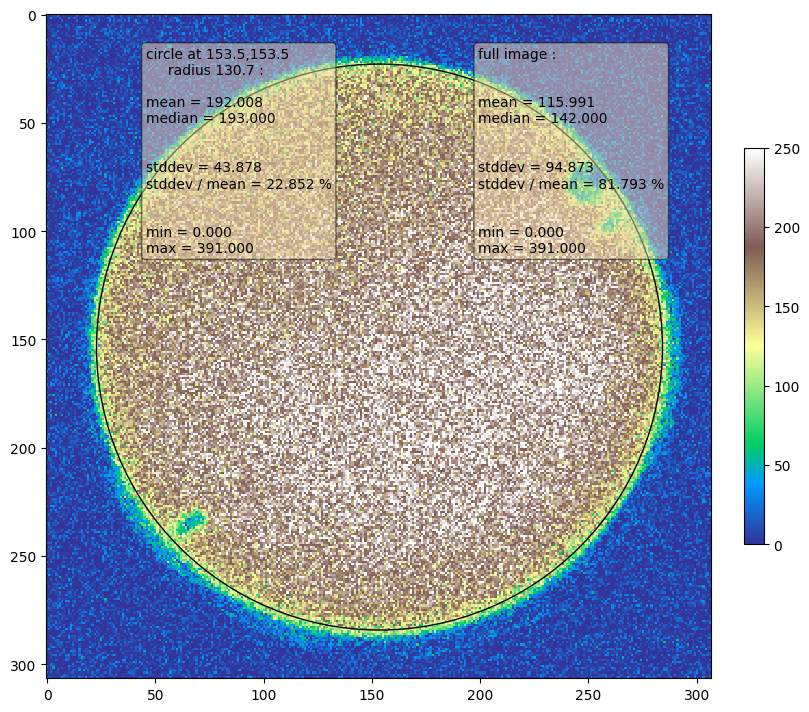

In [42]:
fig, ax = plot_data(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=proton_det_cut_data.data[proton_det_id].circle)

# Center of mass

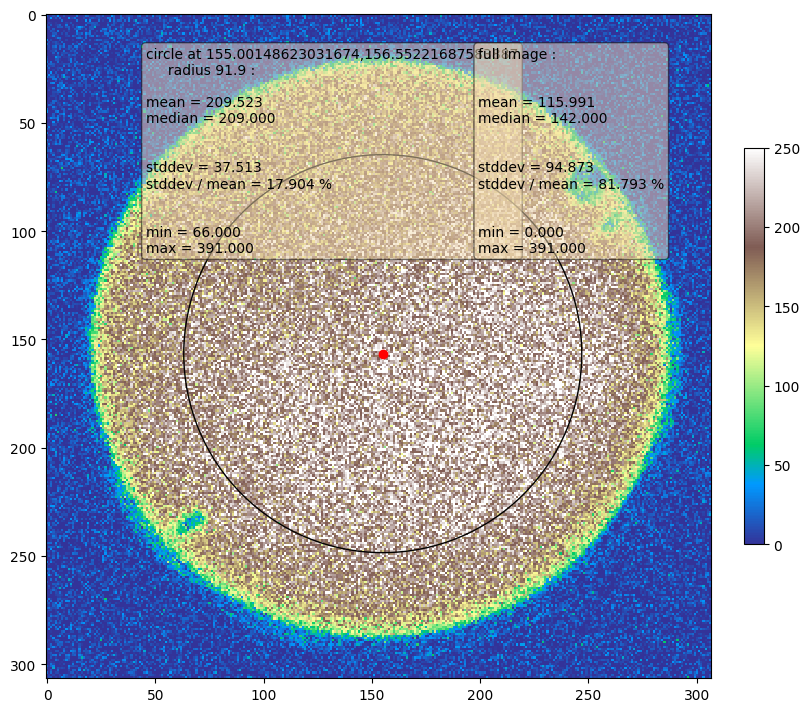

In [43]:
r_px = 7 / px_to_mm

cm1 = center_of_mass_det(proton_det_cut_data.data[proton_det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data_simple(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=cm1_circle, clip=True)
ax.plot(cm1[1], cm1[0], 'o', color='red')

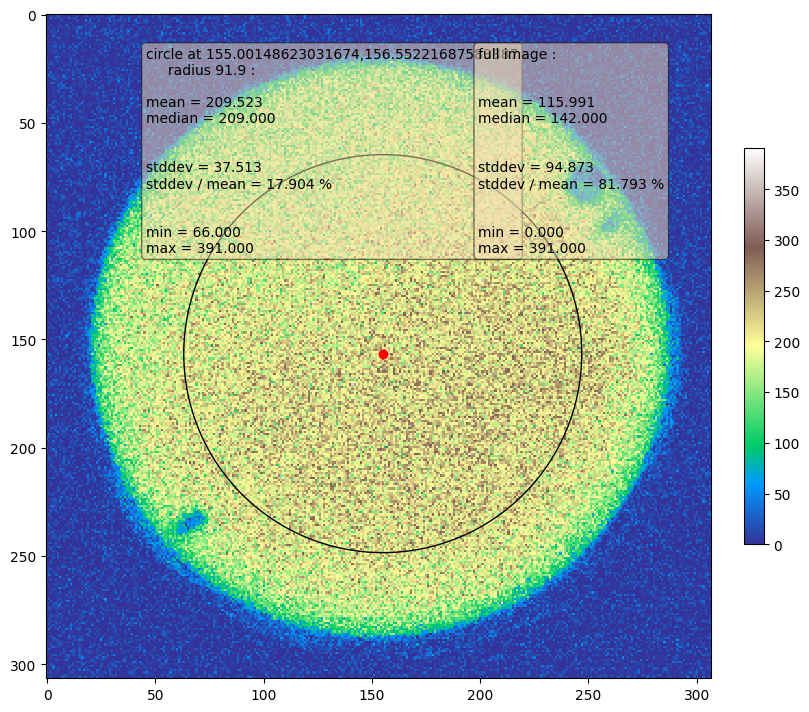

In [44]:
r_px = 7 / px_to_mm
cm1 = center_of_mass_det(proton_det_cut_data.data[proton_det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data_simple(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=cm1_circle, clip=False)
ax.plot(cm1[1], cm1[0], 'o', color='red')

In [45]:

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_cut_bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)

        # detectors we used without collimator
        r_mm = 10
        r_px = r_mm / px_to_mm

        cm = center_of_mass_det(data)
        cm_circle = Circle(x=cm[1], y=cm[0], r=r_px)
        ax.plot(cm[1], cm[0], 'o', color='red')
        ax.add_artist(
            plt.Circle(xy=(cm_circle.x, cm_circle.y),
                   radius=cm_circle.r,
                   color='red',
                   fill=False,
                   transform=ax.transData))

        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 498.0
vmin: 0.0, vmax: 401.0


In [46]:
# Save numpy data to disk for calculation of profiles

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):

# for plot_output_path, dataset in zip(
#     [proton_output_path, ],
#     [proton_det_cut_data, ]):
    npy_path = plot_output_path / 'bg_sub_data'
    npy_path.mkdir(parents=True, exist_ok=True)
    for det_no, data in dataset.data.items():
        output_path = npy_path / f'data_det{det_no:02d}'
        np.save(arr=data.raw.image, file=output_path)

# Mean signal inspection

In [47]:
min_radius_all
singal_radius = 0.7 * min_radius_all
singal_radius

89.6

In [67]:
df_data = defaultdict(list)
for data in proton_det_cut_data.data.values():
    cm = center_of_mass_det(data)
    cm_circle = Circle(x=cm[1], y=cm[0], r=singal_radius)
    mask = create_circular_mask(img=data.raw.image, circle_px=cm_circle)
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["proton"]
for data in co60_det_cut_data.data.values():
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["Co60"]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df['perc_error'] = df['std_signal'] / df['mean_signal'] * 100
df

,det_no,mean_signal,std_signal,radiation,perc_error
18,16,280.959940,43.119770,Co60,15.347302
19,17,296.808861,43.039741,Co60,14.500828
20,18,320.609789,45.977999,Co60,14.340797
21,19,325.591782,44.674873,Co60,13.721131
22,20,312.354315,45.608888,Co60,14.601651
23,21,318.818261,46.821669,Co60,14.686006
24,22,298.089917,44.064975,Co60,14.782444
25,23,297.058544,46.345811,Co60,15.601575
26,24,291.979058,49.051699,Co60,16.799732
27,25,291.174679,44.686194,Co60,15.346868


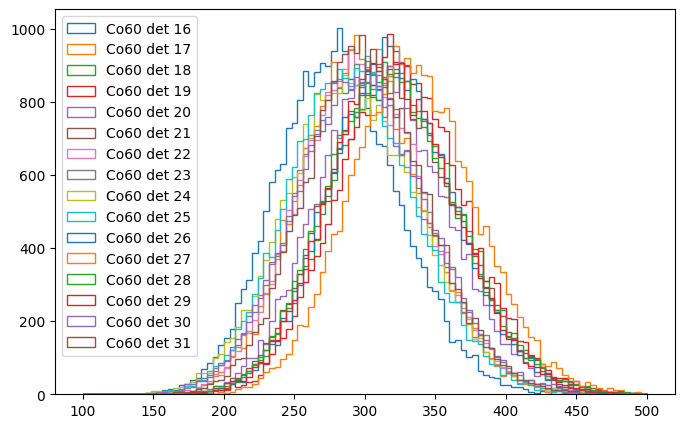

In [68]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
for data in co60_det_cut_data.data.values():
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    ax.hist(data.raw.image[mask].flatten(), bins=100, range=(100,500), label=f"Co60 det {data.det_no}", histtype='step')
ax.legend()

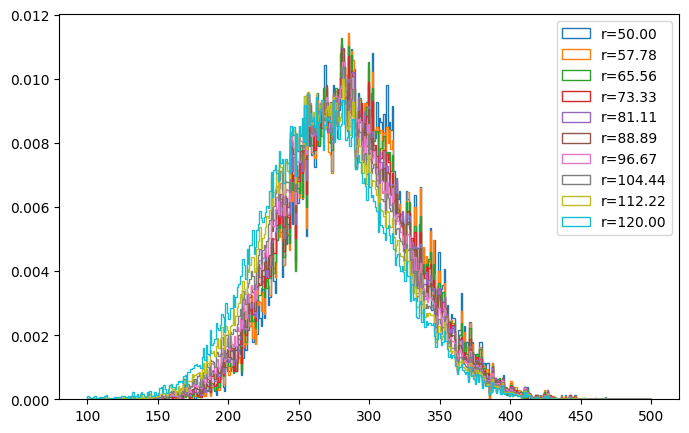

In [69]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
for signal_radius in np.linspace(50, 120, 10):
    data = co60_det_cut_data.data[co60_det_id]
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=signal_radius))
    ax.hist(data.raw.image[mask].flatten(), density=True, bins=400, range=(100,500), label=f"r={signal_radius:.2f}", histtype='step')
ax.legend()

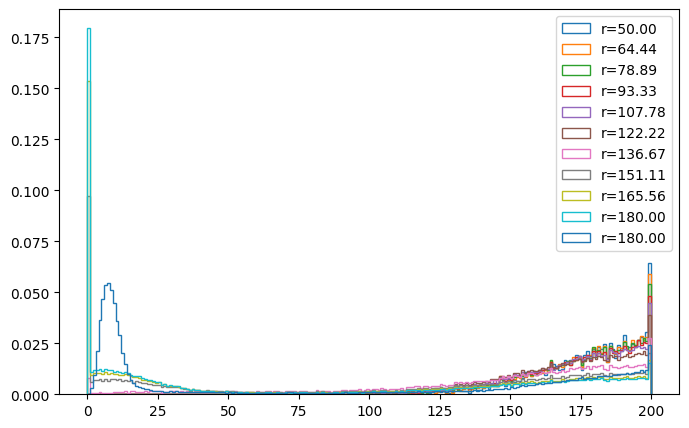

In [70]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
for signal_radius in np.linspace(50, 180, 10):
    data = proton_det_cut_data.data[proton_det_id]
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=signal_radius))
    ax.hist(data.raw.image[mask].flatten(), density=True, bins=200, range=(0,200), label=f"r={signal_radius:.2f}", histtype='step')

data_raw_image_with_gaussian_filter = ndi.gaussian_filter(data.raw.image, sigma=1)
ax.hist(data_raw_image_with_gaussian_filter[mask].flatten(), density=True, bins=200, range=(0,200), label=f"r={signal_radius:.2f}", histtype='step')
ax.legend()

<Axes: xlabel='det_no'>

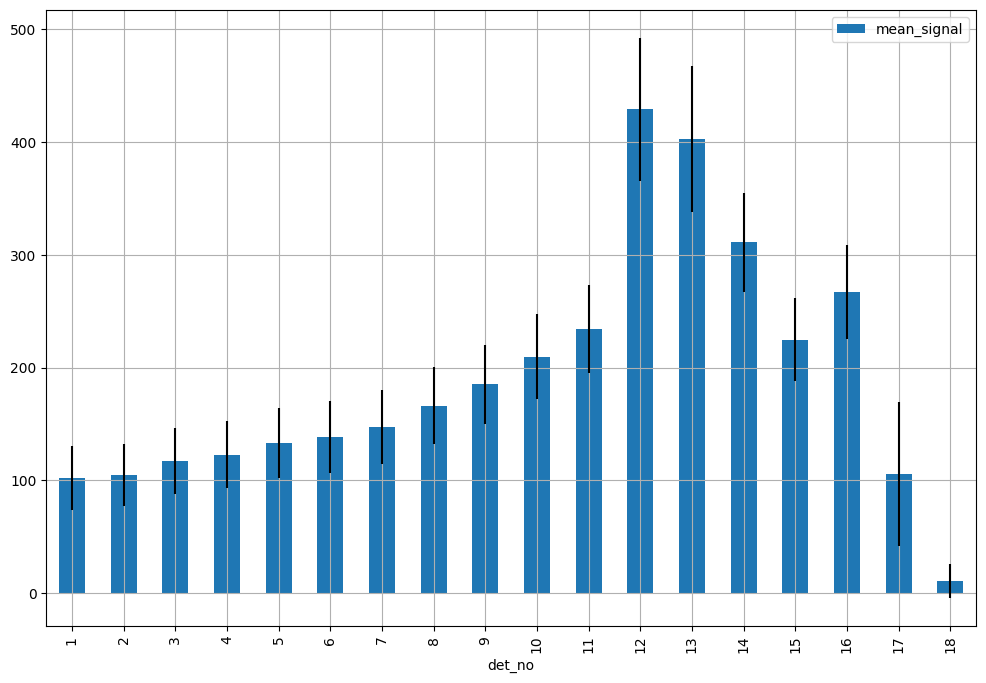

In [71]:
df.query("radiation == 'proton'").plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

<Axes: xlabel='det_no'>

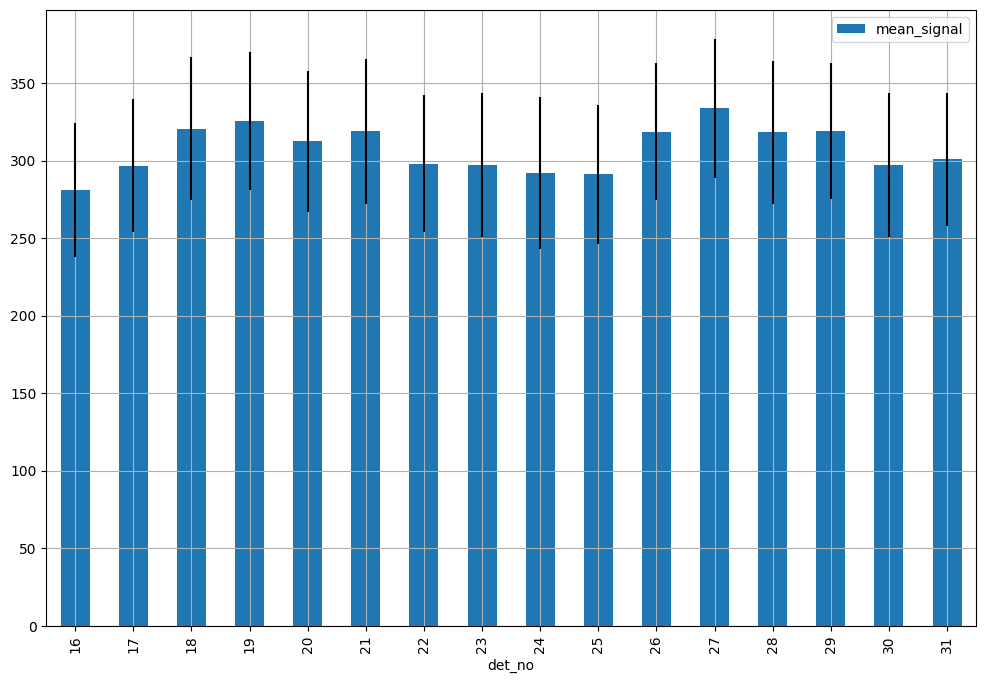

In [72]:
df[df.radiation == 'Co60'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

In [73]:
dose_per_unit_signal_Co60_Gy = df.query("radiation == 'Co60'").mean_signal.mean() / 20
dose_per_unit_signal_Co60_Gy

15.378983594121848

In [74]:
# df = df.join(dose_per_unit_signal_Co60_Gy, on='det_no', rsuffix='_per_Gy')
# df

In [76]:
df['dose_Co60_Gy'] = df.mean_signal / dose_per_unit_signal_Co60_Gy
df

,det_no,mean_signal,std_signal,radiation,perc_error,dose_Co60_Gy
18,16,280.959940,43.119770,Co60,15.347302,18.269084
19,17,296.808861,43.039741,Co60,14.500828,19.299641
20,18,320.609789,45.977999,Co60,14.340797,20.847268
21,19,325.591782,44.674873,Co60,13.721131,21.171216
22,20,312.354315,45.608888,Co60,14.601651,20.310465
23,21,318.818261,46.821669,Co60,14.686006,20.730776
24,22,298.089917,44.064975,Co60,14.782444,19.382940
25,23,297.058544,46.345811,Co60,15.601575,19.315876
26,24,291.979058,49.051699,Co60,16.799732,18.985589
27,25,291.174679,44.686194,Co60,15.346868,18.933285


<Axes: xlabel='det_no'>

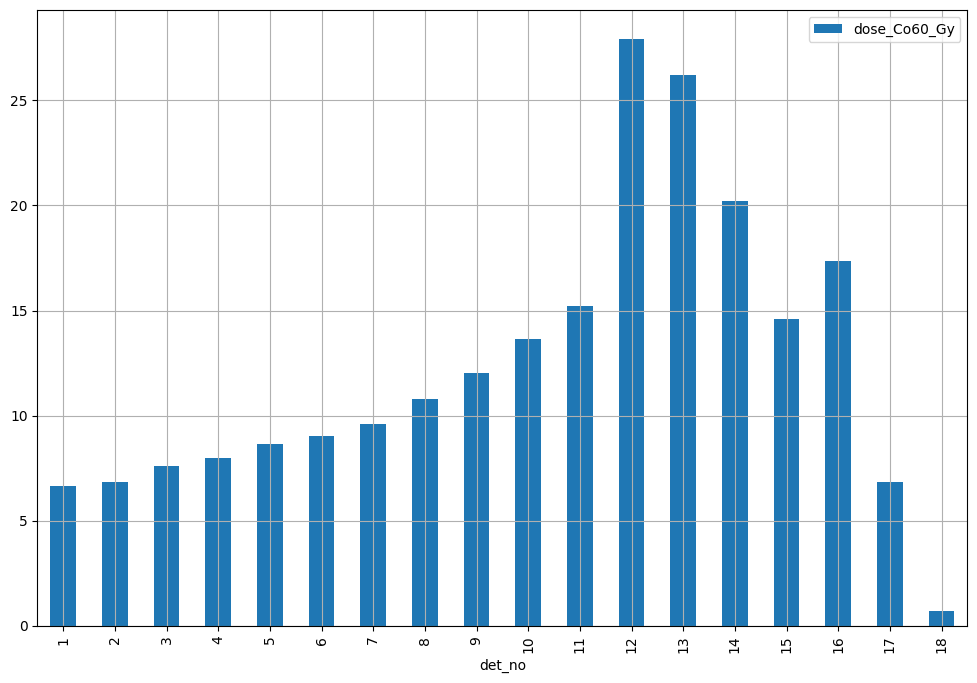

In [77]:
df.query("radiation == 'proton'").plot(x='det_no', y='dose_Co60_Gy', kind='bar', figsize=(12, 8), grid=True)

In [79]:
df.query('radiation == "proton" and det_no == 1').dose_Co60_Gy / 7.

9    0.947695
Name: dose_Co60_Gy, dtype: float64

In [80]:
df.to_hdf(proton_output_path / 'mean_values.h5', key='data', mode='w')

# Finding circles

In [63]:
det_data_dict = {}
for data in proton_det_cut_data.data.values():
    det_data_dict[data.det_no] = data
    print(f"{data.det_no} ", end='')
proton_det_sel_data = DetectorDataCollection(path=proton_det_cut_data.path, data=det_data_dict)

10 11 12 13 14 15 16 17 18 1 2 3 4 5 6 7 8 9 

In [57]:
det_data_dict = {}
for data in co60_det_cut_data.data.values():
    det_data_dict[data.det_no] = data
    print(f"{data.det_no} ", end='')
co60_det_sel_data = DetectorDataCollection(path=co60_det_cut_data.path, data=det_data_dict)

16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 

In [58]:
num_circles = 10000
small_radius = 10
shift_x, shift_y = [], []
min_radius_all = 100

center_max_radius_px = 0.8*min_radius_all-small_radius
center_max_radius_mm = center_max_radius_px * px_to_mm

for _ in range(num_circles):
    angle = random.uniform(0, 2*np.pi)
    distance = random.uniform(0, center_max_radius_px)
    shift_x.append(distance * math.cos(angle))
    shift_y.append(distance * math.sin(angle))

center_max_radius_mm

5.276299098606455

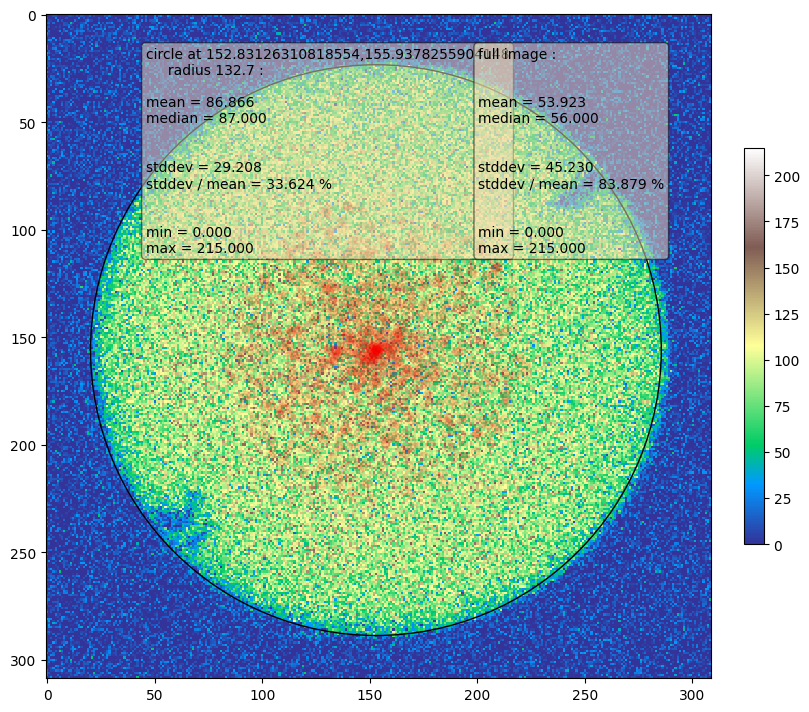

In [59]:
cm1 = center_of_mass_det(proton_det_cut_data.data[proton_det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data_simple(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=cm1_circle, clip=False)
for circle_no in range(num_circles)[:1000]:
    circle = Circle(x=cm1_circle.x + shift_x[circle_no], y=cm1_circle.y + shift_y[circle_no], r=small_radius)
    ax.plot(circle.x, circle.y, 'o', color='red', alpha=0.1)

In [60]:
df_data = defaultdict(list)
for data in proton_det_sel_data.data.values():
    cm1 = center_of_mass_det(data)
    cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
    for circle_no in range(num_circles):
        circle = Circle(x=cm1_circle.x + shift_x[circle_no], y=cm1_circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["proton"]
        df_data["circle_no"] += [circle_no]
for data in co60_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["Co60"]
        df_data["circle_no"] += [circle_no]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

,det_no,mean_signal,std_signal,radiation,circle_no
160000,16,275.260317,39.215751,Co60,0
160001,16,268.718354,38.913403,Co60,1
160002,16,289.003165,39.437541,Co60,2
160003,16,291.700637,42.354880,Co60,3
160004,16,300.506329,42.205307,Co60,4
...,...,...,...,...,...
159995,31,24.146965,16.629513,proton,9995
159996,31,18.503165,15.093694,proton,9996
159997,31,19.141026,15.796157,proton,9997
159998,31,19.725806,16.208490,proton,9998


<Axes: xlabel='mean_signal', ylabel='Count'>

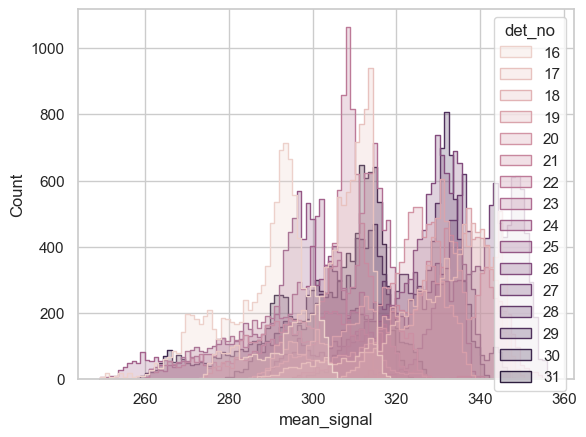

In [61]:
sns.set_theme(style="whitegrid")
sns.histplot(x="mean_signal", hue="det_no", data=df.query('radiation == "Co60"'), element='step')

In [62]:
df2 = pd.DataFrame()
df2["mean"] = df.groupby(["radiation", "det_no"])["mean_signal"].mean()
df2["std"] = df.groupby(["radiation", "det_no"])["mean_signal"].std()
df2

mean        std
radiation det_no                       
Co60      16      287.548428  10.478534
          17      304.491678   9.752022
          18      330.201418  12.565599
          19      332.053431   8.737240
          20      318.666302  11.491489
          21      327.812147  14.204282
          22      303.663633   9.521763
          23      305.507499  14.421314
          24      295.553139  15.811074
          25      295.482106  11.490633
          26      325.998235   8.298287
          27      341.190771   8.290397
          28      323.823963  13.221950
          29      325.105135   9.221516
          30      302.555651  14.889809
          31      306.169548   9.337200
proton    16       98.058205   3.249141
          17       99.899255   3.183507
          18      114.829991   4.059735
          19      120.495574   3.012314
          20      120.760202   3.339173
          21      135.104784   5.373588
          22      131.994817   4.473337
          23      146.853584   6.918984
          24      164.144002   9.214807
          25      203.324016   7.982629
          26      328.315646  12.758417
          27      392.712732  11.311742
          28      428.462706  15.923901
          29      380.321880  24.543373
          30      141.927466  27.319258
          31       22.827719   4.320390

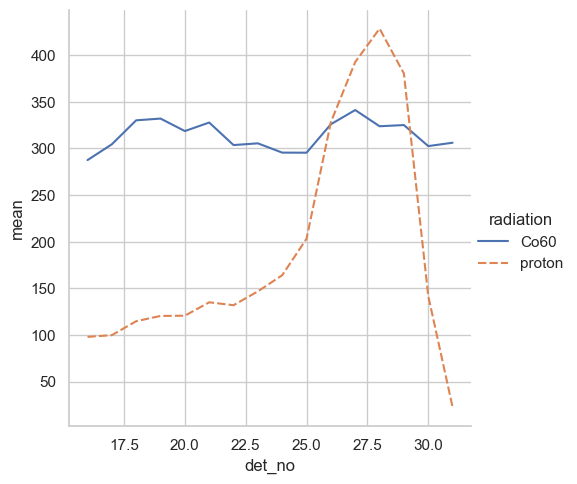

In [63]:
sns.relplot(data=df2.reset_index(), x='det_no', y='mean', hue='radiation', style='radiation', kind='line')

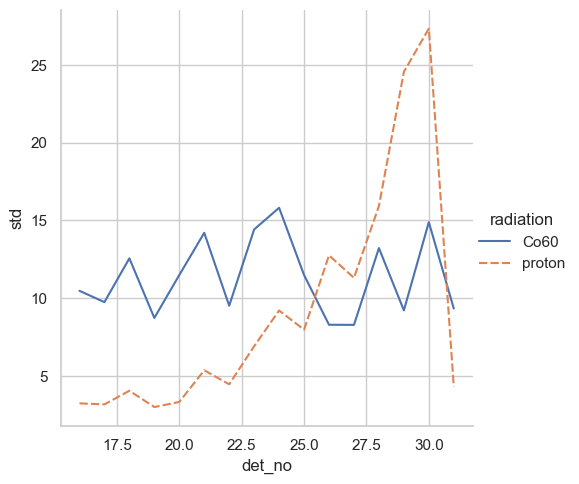

In [64]:
sns.relplot(data=df2.reset_index(), x='det_no', y='std', hue='radiation', style='radiation', kind='line')

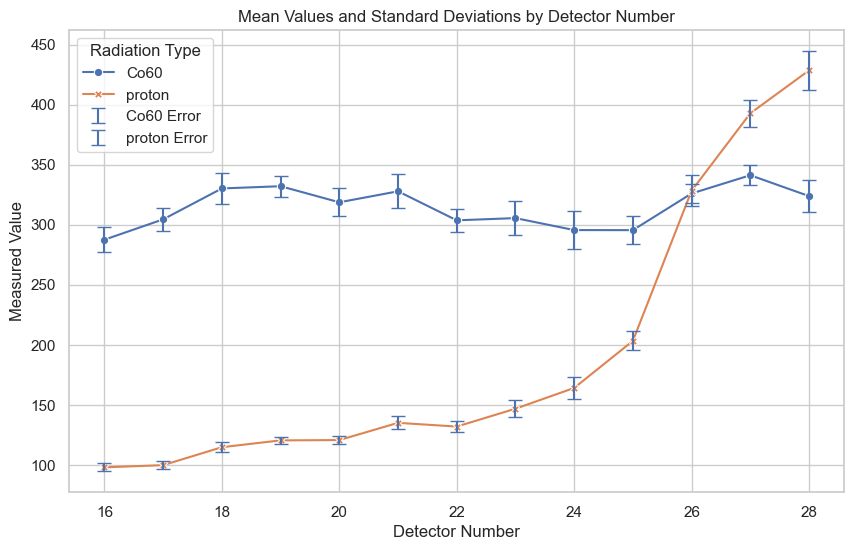

In [65]:
# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()
df2_reset = df2_reset[df2_reset.det_no <= 28]

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points
sns.lineplot(data=df2_reset, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars
for radiation_type in df2_reset['radiation'].unique():
    subset = df2_reset[df2_reset['radiation'] == radiation_type]
    plt.errorbar(subset['det_no'], subset['mean'], yerr=subset['std'], fmt='none', capsize=5, label=f'{radiation_type} Error')

plt.title('Mean Values and Standard Deviations by Detector Number')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

In [66]:
df.to_hdf(base_output_path / 'data_circles.h5', key='df', mode='w')